# CodeBlue: Feature Selection 

We do feature selection because removing irrelevant features leads to better preforming, easier to understand models and they run faster and more efficient. 


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
# from sklearn import preprocessing
# import statistics
# import math
# import os
# import warnings
# warnings.filterwarnings('ignore')
from datetime import datetime as dt
pd.set_option('display.max_columns', None)
import os

# Importing Data

In [3]:
#import clean and cat data
directory = os.getcwd()

data_wrk = pd.read_csv(directory + '/EMS_2017_2018_cat_final.csv', sep=',')
cat_values = pd.read_csv(directory + '/cat_values.csv', sep=',')

In [6]:
data_wrk.head()

,CAD_INCIDENT_ID,INITIAL_CALL_TYPE,INITIAL_SEVERITY_LEVEL_CODE,DISPATCH_RESPONSE_SECONDS_QY,INCIDENT_RESPONSE_SECONDS_QY,INCIDENT_TRAVEL_TM_SECONDS_QY,HELD_INDICATOR,BOROUGH,INCIDENT_DISPATCH_AREA,ZIPCODE,POLICEPRECINCT,CITYCOUNCILDISTRICT,COMMUNITYDISTRICT,COMMUNITYSCHOOLDISTRICT,CONGRESSIONALDISTRICT,TRANSFER_INDICATOR,INCIDENT_Hour,INCIDENT_Month,FIRST_ASSIGNMENT_Hour,FIRST_ASSIGNMENT_Month,FIRST_ACTIVATION_Hour,FIRST_ACTIVATION_Month,FIRST_ON_SCENE_Hour,FIRST_ON_SCENE_Month
0,183654386,14,2,8,461.0,453.0,0,1,12,11201.0,84.0,35.0,302.0,13.0,8.0,0,23,12,23,12,0,1,0,1
1,183654358,92,2,25,328.0,303.0,0,1,12,11201.0,84.0,33.0,302.0,13.0,8.0,0,23,12,23,12,23,12,23,12
2,183654307,92,2,25,134.0,109.0,0,1,12,11215.0,78.0,39.0,306.0,15.0,7.0,0,23,12,23,12,23,12,23,12
3,183654254,81,6,11,425.0,414.0,0,1,12,11201.0,84.0,33.0,302.0,13.0,7.0,0,23,12,23,12,23,12,23,12
4,183654246,84,7,10,898.0,888.0,0,1,12,11215.0,78.0,39.0,306.0,15.0,9.0,0,23,12,23,12,23,12,23,12


# Summary Statistics and charts here

If a feature is mostly the same value, the model wont learn anything new from it so we remove it.

(Drop according to summary statistics from Amanda)


# Remove Datetime Objects, Seperate into Train and Test

In [4]:
data_wrk = data_wrk.drop(['INCIDENT_DATETIME','FIRST_ASSIGNMENT_DATETIME', 
                         'FIRST_ACTIVATION_DATETIME', 'FIRST_ON_SCENE_DATETIME'], axis=1)


In [6]:
#random sample of 20,000 rows for efficiency
#short = data_wrk.sample(n = 20000) 

In [5]:
from sklearn.cross_validation import train_test_split

X = data_wrk.drop('INCIDENT_TRAVEL_TM_SECONDS_QY', axis=1)
Y = data_wrk['INCIDENT_TRAVEL_TM_SECONDS_QY']

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size=.75)

/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [ ]:
# from sklearn.cross_validation import train_test_split

# X = data_wrk.drop('initial_severity_level_code', axis=1)
# Y = data_wrk['initial_severity_level_code']

# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size=.75)

In [4]:
X_train_n = X_train.drop(['INCIDENT_RESPONSE_SECONDS_QY', 'DISPATCH_RESPONSE_SECONDS_QY','INCIDENT_Hour',
       'INCIDENT_Month', 'FIRST_ASSIGNMENT_Hour', 'FIRST_ASSIGNMENT_Month',
       'FIRST_ACTIVATION_Hour', 'FIRST_ACTIVATION_Month',
       'FIRST_ON_SCENE_Hour', 'FIRST_ON_SCENE_Month'], axis=1)

,CAD_INCIDENT_ID,INCIDENT_DATETIME,INITIAL_CALL_TYPE,INITIAL_SEVERITY_LEVEL_CODE,FIRST_ASSIGNMENT_DATETIME,FIRST_ACTIVATION_DATETIME,FIRST_ON_SCENE_DATETIME,HELD_INDICATOR,BOROUGH,INCIDENT_DISPATCH_AREA,ZIPCODE,POLICEPRECINCT,CITYCOUNCILDISTRICT,COMMUNITYDISTRICT,COMMUNITYSCHOOLDISTRICT,CONGRESSIONALDISTRICT,TRANSFER_INDICATOR
1996313,170993841,2017-04-09 22:21:48,56,5,2017-04-09 22:22:11,2017-04-09 22:22:27,2017-04-09 22:30:16,0,1,8,11226.0,70.0,40.0,314.0,22.0,9.0,0
1716808,171493413,2017-05-29 21:48:14,8,1,2017-05-29 21:48:21,2017-05-29 21:48:29,2017-05-29 21:50:35,0,0,0,10454.0,40.0,8.0,201.0,7.0,15.0,0
442418,182002128,2018-07-19 13:34:42,79,3,2018-07-19 13:35:08,2018-07-19 13:35:29,2018-07-19 13:45:12,0,2,16,10022.0,18.0,4.0,105.0,2.0,12.0,0
1803182,172842209,2017-10-11 13:40:31,44,5,2017-10-11 13:41:32,2017-10-11 13:41:46,2017-10-11 13:50:48,0,1,9,11203.0,67.0,45.0,317.0,18.0,9.0,0
358264,173403642,2017-12-06 19:05:26,36,3,2017-12-06 19:05:41,2017-12-06 19:05:53,2017-12-06 19:11:04,0,1,7,11214.0,62.0,43.0,311.0,20.0,11.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1461446,182812373,2018-10-08 14:59:06,13,3,2018-10-08 14:59:22,2018-10-08 14:59:46,2018-10-08 15:02:25,0,3,24,11414.0,106.0,32.0,410.0,27.0,8.0,0
1037618,173263801,2017-11-22 20:22:16,81,6,2017-11-22 20:22:46,2017-11-22 20:23:13,2017-11-22 20:31:25,0,0,1,10460.0,48.0,17.0,206.0,12.0,15.0,0
1832009,170361605,2017-02-05 11:39:01,81,6,2017-02-05 11:39:22,2017-02-05 11:39:33,2017-02-05 11:44:24,0,1,9,11226.0,70.0,40.0,314.0,22.0,9.0,0
1149006,181043932,2018-04-14 19:57:15,14,2,2018-04-14 19:57:47,2018-04-14 19:57:54,2018-04-14 20:05:44,0,1,11,11221.0,81.0,36.0,303.0,16.0,8.0,0


# Covariance and Correlation

In [7]:
cols = short.columns
cols

Index(['CAD_INCIDENT_ID', 'INITIAL_CALL_TYPE', 'INITIAL_SEVERITY_LEVEL_CODE',
       'DISPATCH_RESPONSE_SECONDS_QY', 'INCIDENT_RESPONSE_SECONDS_QY',
       'INCIDENT_TRAVEL_TM_SECONDS_QY', 'HELD_INDICATOR', 'BOROUGH',
       'INCIDENT_DISPATCH_AREA', 'ZIPCODE', 'POLICEPRECINCT',
       'CITYCOUNCILDISTRICT', 'COMMUNITYDISTRICT', 'COMMUNITYSCHOOLDISTRICT',
       'CONGRESSIONALDISTRICT', 'TRANSFER_INDICATOR', 'INCIDENT_Hour',
       'INCIDENT_Month', 'FIRST_ASSIGNMENT_Hour', 'FIRST_ASSIGNMENT_Month',
       'FIRST_ACTIVATION_Hour', 'FIRST_ACTIVATION_Month',
       'FIRST_ON_SCENE_Hour', 'FIRST_ON_SCENE_Month'],
      dtype='object')

/anaconda3/lib/python3.6/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


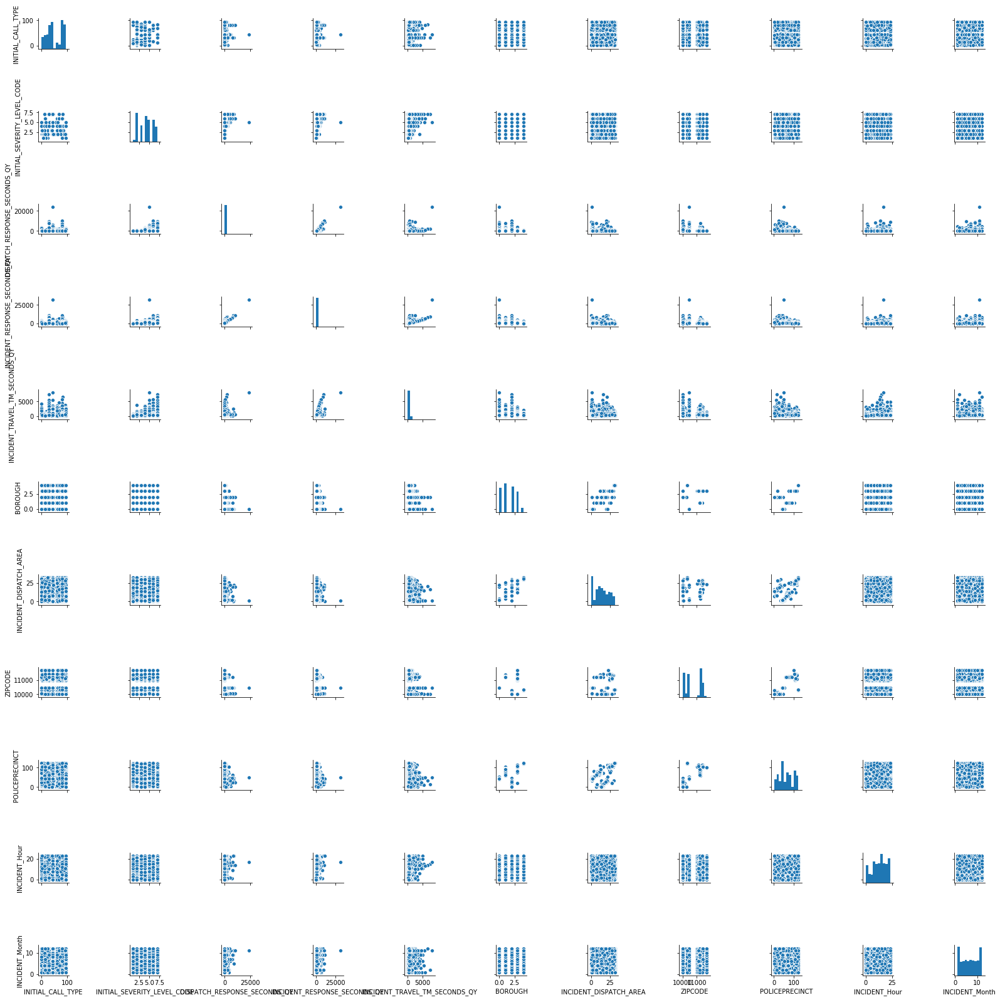

In [8]:
#Let's try to limit them
cols = ['INITIAL_CALL_TYPE', 'INITIAL_SEVERITY_LEVEL_CODE', 'DISPATCH_RESPONSE_SECONDS_QY',
        'INCIDENT_RESPONSE_SECONDS_QY', 'INCIDENT_TRAVEL_TM_SECONDS_QY', 'BOROUGH',
        'INCIDENT_DISPATCH_AREA', 'ZIPCODE', 'POLICEPRECINCT','INCIDENT_Hour',
       'INCIDENT_Month']

sns.pairplot(short[cols], size=2.0)

In [11]:
short.columns

Index(['CAD_INCIDENT_ID', 'INITIAL_CALL_TYPE', 'INITIAL_SEVERITY_LEVEL_CODE',
       'DISPATCH_RESPONSE_SECONDS_QY', 'INCIDENT_RESPONSE_SECONDS_QY',
       'INCIDENT_TRAVEL_TM_SECONDS_QY', 'HELD_INDICATOR', 'BOROUGH',
       'INCIDENT_DISPATCH_AREA', 'ZIPCODE', 'POLICEPRECINCT',
       'CITYCOUNCILDISTRICT', 'COMMUNITYDISTRICT', 'COMMUNITYSCHOOLDISTRICT',
       'CONGRESSIONALDISTRICT', 'TRANSFER_INDICATOR', 'INCIDENT_Hour',
       'INCIDENT_Month', 'FIRST_ASSIGNMENT_Hour', 'FIRST_ASSIGNMENT_Month',
       'FIRST_ACTIVATION_Hour', 'FIRST_ACTIVATION_Month',
       'FIRST_ON_SCENE_Hour', 'FIRST_ON_SCENE_Month'],
      dtype='object')

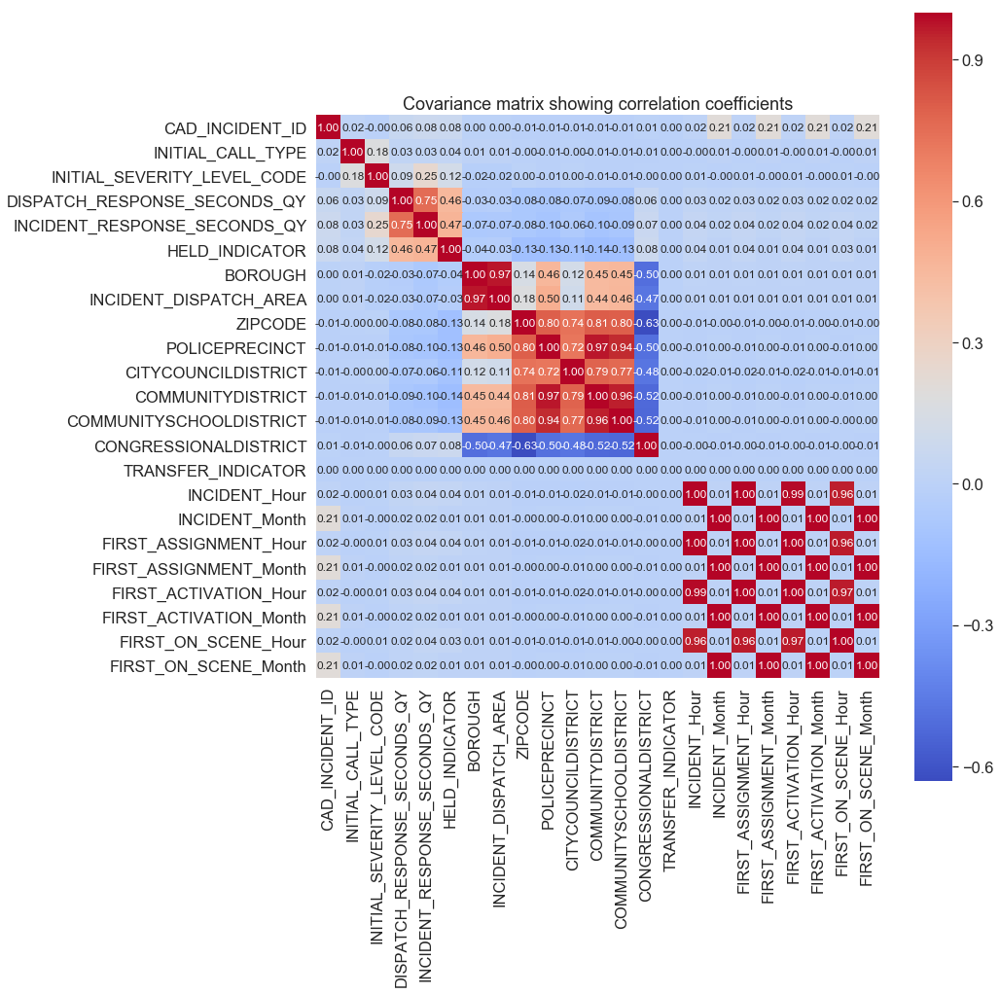

In [15]:
b = short.drop('INCIDENT_TRAVEL_TM_SECONDS_QY', axis=1)
cols = b.columns

from sklearn.preprocessing import StandardScaler 

stdsc = StandardScaler() 
X_std = stdsc.fit_transform(b[cols].values)

cov_mat =np.cov(X_std.T)
plt.figure(figsize=(15,15))
sns.set(font_scale=1.5)
hm = sns.heatmap(cov_mat,
                 cbar=True,
                 annot=True,
                 square=True,
                 fmt='.2f',
                 annot_kws={'size': 12},
                 cmap='coolwarm',                 
                 yticklabels=cols,
                 xticklabels=cols)
plt.title('Covariance matrix showing correlation coefficients', size = 18)
plt.tight_layout()
plt.show()

If 2 features are highly correlated, they are redundant so you can drop one without looseing a lot of information. If there is not a lot of correlation with target we can also drop it. This is not as reliable because together with another feature, they might have correlation with the target (aka interaction terms). 

Variables with high correlation have no mutual information 


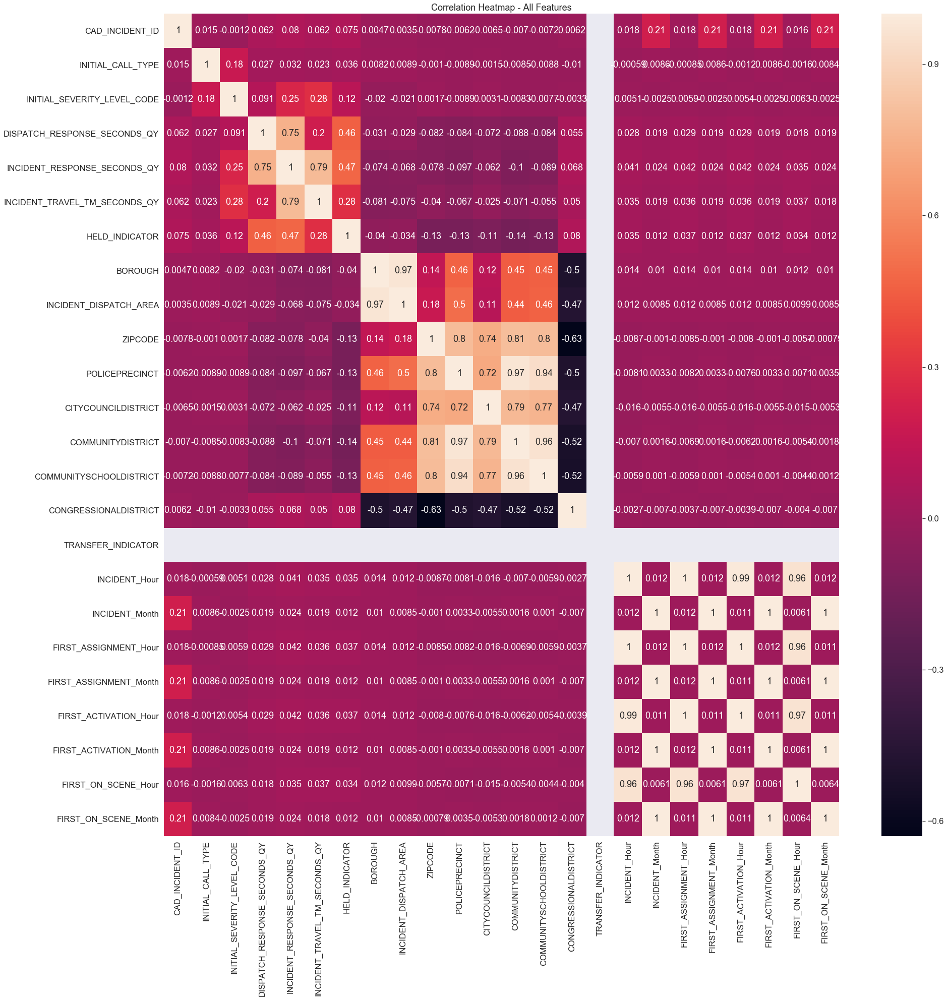

In [19]:
corr = short.corr()

plt.figure(figsize=(30, 30))
plt.title('Correlation Heatmap - All Features')
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=True);

In general, we usually want to be cautious when several variables are highly correlated (and even more so if they are collinear). Certain supervised learning algorithms, such as tree-based algorithms, can automatically deal with highly correlated variables. Tree-based algorithms are particularly good at handling data 'as-is,' and one might choose to use them based on that property.

Prof notes

# Decision Tree
Mutual information is how much dependency there is on two variables. Knowing the value of one variable gives you more information about another. There is no sense in keeping variables that have no relationship with the outcome. Decision tree have internal feature important with cumulative amount of information gain. They also do binning implicitly. 

We'll use the Decision Tree classifier's built in feature importance attribute to compute the normalized Mutual Information/Information Gain of each feature. 

In [ ]:
from sklearn import tree

Text(0.5,0,'Relative Importance')

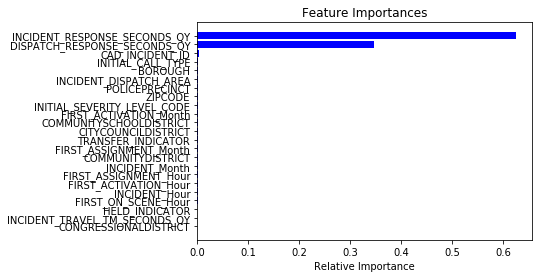

In [9]:
model = tree.DecisionTreeClassifier(criterion='entropy')

# X_train = data_wrk.drop('incident_travel_tm_seconds_qy', axis=1)
# Y_train = data_wrk['incident_travel_tm_seconds_qy']

model = model.fit(X_train, Y_train)

importances = model.feature_importances_
indices = np.argsort(importances)
features = data_wrk.columns

plt.figure(1)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')

In [5]:
# Should already be out
# X_train_n = X_train_n.drop(['INCIDENT_DATETIME', 'CAD_INCIDENT_ID','FIRST_ASSIGNMENT_DATETIME', 
#                             'FIRST_ACTIVATION_DATETIME', 'FIRST_ON_SCENE_DATETIME'], axis=1)

In [8]:
model = tree.DecisionTreeClassifier(criterion='entropy')

In [9]:
model = model.fit(X_train_n, Y_train)

In [10]:
importances = model.feature_importances_
indices = np.argsort(importances)
features = X_train_n.columns

Text(0.5,0,'Relative Importance')

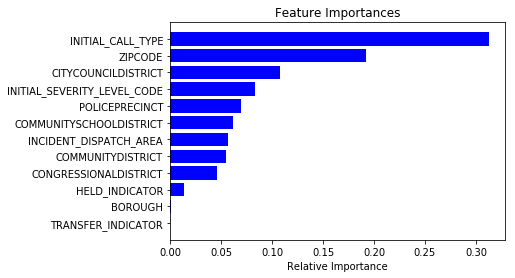

In [11]:
plt.figure(1)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')

In [ ]:
# model = tree.DecisionTreeClassifier(criterion='entropy')

# X_train_n = X_train.drop(['INCIDENT_RESPONSE_SECONDS_QY', 'DISPATCH_RESPONSE_SECONDS_QY','INCIDENT_Hour',
#        'INCIDENT_Month', 'FIRST_ASSIGNMENT_Hour', 'FIRST_ASSIGNMENT_Month',
#        'FIRST_ACTIVATION_Hour', 'FIRST_ACTIVATION_Month',
#        'FIRST_ON_SCENE_Hour', 'FIRST_ON_SCENE_Month'], axis=1)
# # Y_train = data_wrk['incident_travel_tm_seconds_qy']

# model = model.fit(X_train_n, Y_train)

# importances = model.feature_importances_
# indices = np.argsort(importances)
# features = X_train_n.columns

# plt.figure(1)
# plt.title('Feature Importances')
# plt.barh(range(len(indices)), importances[indices], color='b', align='center')
# plt.yticks(range(len(indices)), features[indices])
# plt.xlabel('Relative Importance')

In [12]:
#Add features and their importances to a dictionary
feature_mi_dict = dict(zip(data_wrk.columns.values, importances))
feature_mi_dict

{'BOROUGH': 1.6476008189715107e-05,
 'CAD_INCIDENT_ID': 0.3127085935331651,
 'DISPATCH_RESPONSE_SECONDS_QY': 0.1924844476220222,
 'FIRST_ACTIVATION_DATETIME': 0.06967422507786336,
 'FIRST_ASSIGNMENT_DATETIME': 0.056751936947326304,
 'FIRST_ON_SCENE_DATETIME': 0.10753003619833694,
 'HELD_INDICATOR': 0.04617621412933,
 'INCIDENT_DATETIME': 0.08343696492897133,
 'INCIDENT_RESPONSE_SECONDS_QY': 0.054648221988204515,
 'INCIDENT_TRAVEL_TM_SECONDS_QY': 0.06147818019026236,
 'INITIAL_CALL_TYPE': 0.013699370230682956,
 'INITIAL_SEVERITY_LEVEL_CODE': 0.001395333145645379}

With severity

Text(0.5,0,'Relative Importance')

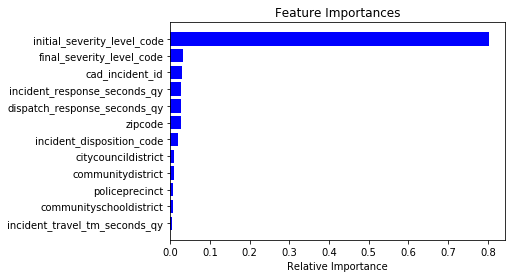

In [9]:
# model = tree.DecisionTreeClassifier(criterion='entropy')

# X_train = data_wrk.drop('initial_severity_level_code', axis=1)
# Y_train = data_wrk['initial_severity_level_code']

# model = model.fit(X_train,Y_train)

# importances = model.feature_importances_
# indices = np.argsort(importances)
# features = data_wrk.columns

# plt.figure(1)
# plt.title('Feature Importances')
# plt.barh(range(len(indices)), importances[indices], color='b', align='center')
# plt.yticks(range(len(indices)), features[indices])
# plt.xlabel('Relative Importance')

In [10]:
# #Add features and their importances to a dictionary
# feature_mi_dict = dict(zip(data_wrk.columns.values, importances))
# feature_mi_dict

{'cad_incident_id': 0.028454891964726413,
 'citycouncildistrict': 0.008345710462119496,
 'communitydistrict': 0.008217162198809138,
 'communityschooldistrict': 0.006503013684648895,
 'dispatch_response_seconds_qy': 0.027398409108919667,
 'final_severity_level_code': 0.032677719588795465,
 'incident_disposition_code': 0.019591702009979055,
 'incident_response_seconds_qy': 0.027829050554757873,
 'incident_travel_tm_seconds_qy': 0.0037324362126008857,
 'initial_severity_level_code': 0.80379598811278,
 'policeprecinct': 0.006912202928599582,
 'zipcode': 0.026541713173263516}

# ROC Curves
# THIS ONLY WORKS FOR CLASSIFICATION PROBLEMS:

In [128]:
#compute feature ranks using AUC
from sklearn.metrics import roc_curve, auc

def plotUnivariateROC(preds, truth, label_string):
    '''
    preds is an nx1 array of predictions
    truth is an nx1 array of truth labels
    label_string is text to go into the plotting label
    '''
    #Student input code here
    #1. call the roc_curve function to get the ROC X and Y values
    fpr, tpr, thresholds = roc_curve(truth, preds)
    #2. Input fpr and tpr into the auc function to get the AUC
    roc_auc = auc(fpr, tpr)
    
    #we are doing this as a special case because we are sending unfitted predictions
    #into the function
    if roc_auc < 0.5:
        fpr, tpr, thresholds = roc_curve(truth, -1 * preds)
        roc_auc = auc(fpr, tpr)

    #chooses a random color for plotting
    c = (np.random.rand(), np.random.rand(), np.random.rand())

    #create a plot and set some options
    plt.plot(fpr, tpr, color = c, label = label_string + ' (AUC = %0.3f)' % roc_auc)
    

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.title('ROC')
    plt.legend(loc="lower right")
    
    return roc_auc

In [131]:
X = data_wrk.drop('initial_severity_level_code', axis=1)
y = data_wrk['initial_severity_level_code']

In [132]:
X

,cad_incident_id,dispatch_response_seconds_qy,incident_response_seconds_qy,incident_travel_tm_seconds_qy,incident_disposition_code,zipcode,policeprecinct,citycouncildistrict,communitydistrict,communityschooldistrict,congressionaldistrict
0,183654386,8,461.0,453.0,82.0,11201.0,84.0,35.0,302.0,13.0,8.0
1,183654385,110,479.0,369.0,91.0,11416.0,102.0,32.0,409.0,27.0,7.0
2,183654384,118,933.0,815.0,82.0,11369.0,115.0,21.0,480.0,30.0,14.0
3,183654383,8,356.0,348.0,82.0,11214.0,62.0,47.0,311.0,20.0,11.0
4,183654382,177,1038.0,861.0,82.0,10019.0,18.0,4.0,105.0,2.0,12.0
...,...,...,...,...,...,...,...,...,...,...,...
994,183653260,5,474.0,469.0,82.0,11236.0,69.0,46.0,318.0,18.0,8.0
995,183653259,130,807.0,677.0,93.0,10030.0,32.0,9.0,110.0,5.0,13.0
996,183653258,8,295.0,287.0,90.0,10003.0,9.0,2.0,102.0,2.0,12.0
998,183653255,16,609.0,593.0,82.0,10310.0,120.0,49.0,501.0,31.0,11.0


ValueError: multiclass format is not supported

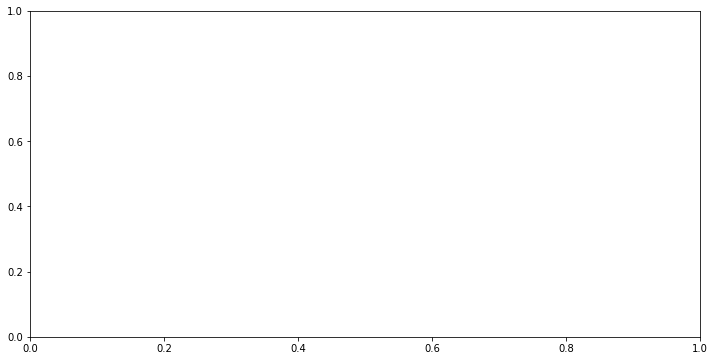

In [130]:
fig = plt.figure(figsize = (12, 6))
ax = plt.subplot(111)

#Plot the univariate AUC on the training data. Store the AUC

#Student put code here
feature_auc_dict = {}
for col in data_wrk.drop('initial_severity_level_code',1).columns:
    feature_auc_dict[col] = plotUnivariateROC(data_wrk[col], Y, col)


# Put a legend below current axis
box = ax.get_position()
ax.set_position([box.x0, box.y0 + box.height * 0.0 , box.width, box.height * 1])
ax.legend(loc = 'upper center', bbox_to_anchor = (0.5, -0.15), fancybox = True, 
              shadow = True, ncol = 4, prop = {'size':10})

In [ ]:
#Add auc and mi each to a single dataframe
df_auc = pd.DataFrame(pd.Series(feature_auc_dict), columns = ['auc'])
df_mi = pd.DataFrame(pd.Series(feature_mi_dict), columns = ['mi'])

#Now merge the two on the feature name
feat_imp_df = df_auc.merge(df_mi, left_index = True, right_index = True)
feat_imp_df

A feature can be incredibly predictive but has low coverage. I.e., look at 'multiple_buy.' When it is positive it is highly predictive, but it is only positive in a few cases. This will make the AUC lower (because it is the area under the curve).

The Mutual Information as represented by the featureimportance\ attribute of the Decision Tree is technically not Mutual Information between X and Y. Technically, it is the cumulative MI of possible multiple binary splits on the given feature throughout the tree. The source code can show you how this is done. Further, this the cumulative MI within the tree, which is conditional on any prior splits. When two (or more) variables are correlated, the information gained from a redundant feature is often very low. Thus, you can see that a feature might have a high AUC but low MI as computed by the DT learning process.

The right way to do this analysis would be to compute only univariate MI between each X and Y separately (the way we did it for AUC).

In [ ]:
feat_ranks = feat_imp_df.rank(axis = 0, ascending = False)

In [ ]:
#Now create lists of top 5 features for both auc and mi
top5_auc = list(feat_ranks[(feat_ranks.auc <= 5)].index.values)
top5_mi = list(feat_ranks[(feat_ranks.mi <= 5)].index.values)
top5_auc, top5_mi

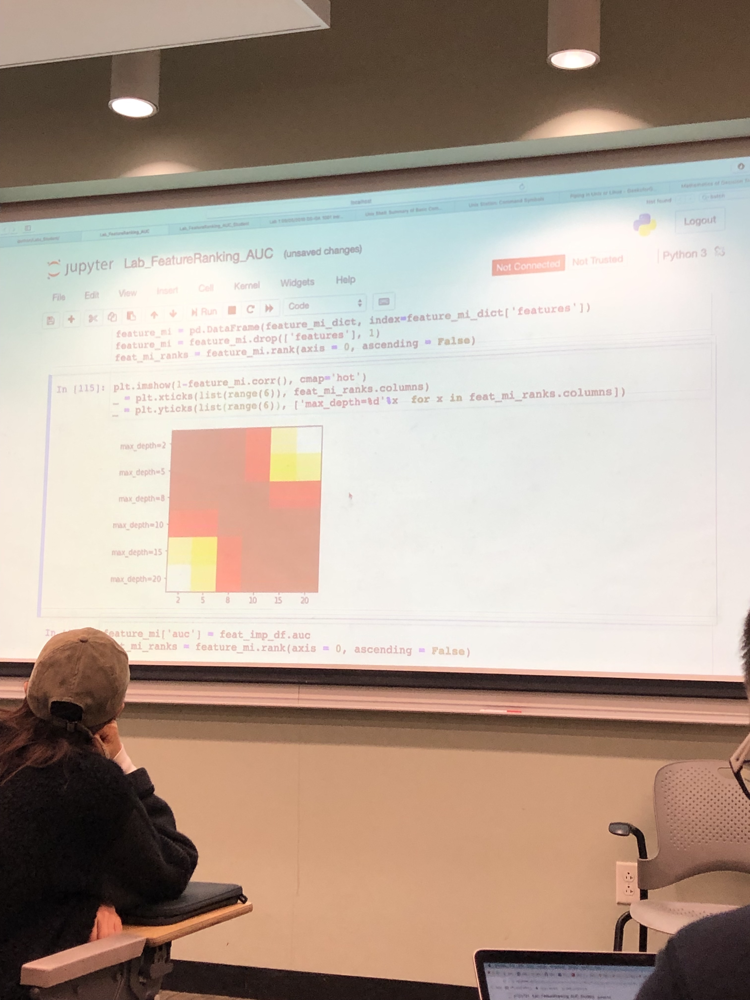

In [154]:
from IPython.display import Image
Image(filename='NanCode.png')

---

Anything with 0 correlation and mutual information factor means the feature is good for describing dependencies, but wont tell you if the relationship is positive or negative. It just captures any type of relationship.

# Random Forest

Decision trees overfit though, so let's try with a random forest.

Therefore, when training a tree, it is possible to compute how much each feature decreases the impurity. The more a feature decreases the impurity, the more important the feature is. In random forests, the impurity decrease from each feature can be averaged across trees to determine the final importance of the variable.
To give a better intuition, features that are selected at the top of the trees are in general more important than features that are selected at the end nodes of the trees, as generally the top splits lead to bigger information gains.

**Should be done without correlated counterparts because correlated features will show in a tree similar and lowered importance**

**In all feature selection procedures, it is a good practice to select the features by examining only the training set. This is to avoid overfitting.**
https://towardsdatascience.com/feature-selection-using-random-forest-26d7b747597f

In [13]:
from sklearn.ensemble.forest import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn import cross_validation
from sklearn.cross_validation import train_test_split

SelectFromModel will select those features which importance is greater than the mean importance of all the features by default, but we can alter this threshold if we want.

In [12]:
# X_train = data_wrk.drop('incident_travel_tm_seconds_qy', axis=1)
# Y_train = data_wrk['incident_travel_tm_seconds_qy']

In [61]:
#X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size=.75)

In [14]:
sel = SelectFromModel(RandomForestClassifier(n_estimators = 50))

In [ ]:
#C R A S H E S
sel.fit(X_train_n, Y_train)

In [15]:
#To see which features are important we can use get_support method on the fitted model.
sel.get_support()
#It will return an array of boolean values. 
#True for the features whose importance is greater than the mean importance and False for the rest.

array([ True, False, False,  True,  True, False,  True, False, False,
       False, False, False])

In [16]:
selected_feat= X_train.columns[(sel.get_support())]
print(selected_feat)
# To get the name of the features selected

Index(['cad_incident_id', 'dispatch_response_seconds_qy',
       'incident_response_seconds_qy', 'zipcode'],
      dtype='object')


In [17]:
pd.Series(sel.estimator_.feature_importances_.ravel())

0     0.118926
1     0.059983
2     0.061209
3     0.128226
4     0.156282
5     0.042925
6     0.094512
7     0.078553
8     0.075178
9     0.071949
10    0.061161
11    0.051097
dtype: float64

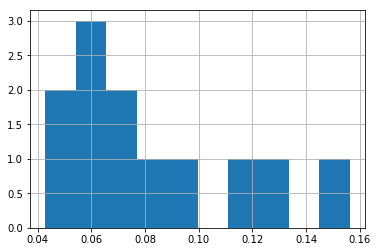

In [18]:
pd.Series(sel.estimator_.feature_importances_.ravel()).hist()
#We can also check and plot the distribution of importance.

Correlated features will be given equal or similar importance, but overall reduced importance compared to the same tree built without correlated counterparts.
Random Forests and decision trees, in general, give preference to features with high cardinality ( Trees are biased to these type of variables ).

you might want to select your features like you do validation most iportant features might be different depending on the model.
Because MI is selsected based on DT model, easy to be / might be overfit.

# L1-regularization

L1-regularization ends up zeroing out many coefficients. Since these coefficients are the multiplicative weights on the features, L1-regularization effectively performs an automatic form of feature selection.

First I specify the Logistic Regression model, and I make sure I select the Lasso (L1) penalty.Then I use the selectFromModel object from sklearn, which will select in theory the features which coefficients are non-zero.


In [7]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# %matplotlib inline
# from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler

What is C?
Keep in mind that increasing the penalisation c will increase the number of features removed. Therefore, we will need to keep an eye and monitor that we don’t set a penalty too high so that to remove even important features, or too low and then not remove non-important features.

In [10]:
#Scaling the data, as linear models benefits from feature scaling
scaler = StandardScaler()
scaler.fit(X_train_n.fillna(0)) #.fillna(0)

sel_ = SelectFromModel(LogisticRegression(C=1, penalty='l1'))
sel_.fit(scaler.transform(X_train_n.fillna(0)), Y)

ValueError: Found input variables with inconsistent numbers of samples: [2048002, 2730670]

In [20]:
#Scaling the data, as linear models benefits from feature scaling
scaler = StandardScaler()
scaler.fit(X_train)

sel_ = SelectFromModel(LogisticRegression(C=1, penalty='l1'))
sel_.fit(scaler.transform(X_train), Y_train)

SelectFromModel(estimator=LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l1', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False),
        norm_order=1, prefit=False, threshold=None)

In [21]:
sel_.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

So True is for the features that lasso thought is important (non-zero features) while False is for the features whose weights were shrinked to zero and are not important according to Lasso.

In [22]:
selected_feat = X_train.columns[(sel_.get_support())]

print('total features: {}'.format((X_train.shape[1])))
print('selected features: {}'.format(len(selected_feat)))
print('features with coefficients shrank to zero: {}'.format(
      np.sum(sel_.estimator_.coef_ == 0)))

total features: 12
selected features: 12
features with coefficients shrank to zero: 4782


In [85]:
#Identifying the removed features
removed_feats = X.columns[(sel_.estimator_.coef_ == 0).ravel().tolist()]
removed_feats
#was not helpful in testing enviornemnt

IndexError: boolean index did not match indexed array along dimension 0; dimension is 11 but corresponding boolean dimension is 6248

Remove the features from training an test set which are not important